This notebook acts as a pipeline for training, testing and evaluating the models.<br>

We will be doing training and evaluation of different models.<br>
1. LogisticRegression with Gradient Descent
2. Sklearn's Logistic Regression
3. Decision Tree Classifiers

Firstly, lets import all the required libraries and all the functions from our source files.

In [1]:
from src.preprocess import preprocess_data
from src.train_models import sigmoid,train_model, calculate_cost, gradient_descent, train_decision_tree, train_sklearn_logistic_regression, find_learning_rate
from src.evaluate import evaluate_model, plot_evaluation_metrics, k_fold_cross_validation, evaluate_model_sklearn, plot_evaluation_metrics_sklearn
import pandas as pd
import numpy as np
import joblib

In [2]:
# Load and preprocess data
data = pd.read_csv('dataset/student.csv')
X_train, X_test, y_train, y_test, X_train_smote, y_train_smote, X_train_rus, y_train_rus = preprocess_data(data)

c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

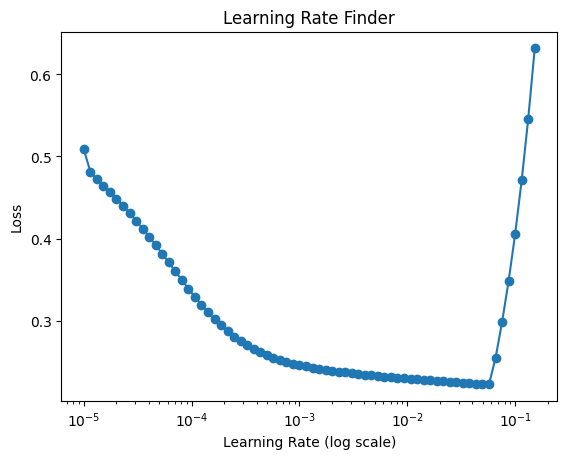

Best Learning Rate: 0.1747528400007683


In [3]:
#Initialize theta and find the best learning rate
theta_initial = np.zeros(X_train.shape[1])
best_learning_rate = find_learning_rate(X_train, y_train, theta_initial, 1000, 0.1)
print(f'Best Learning Rate: {best_learning_rate}')

In [4]:
# Set hyperparameters for training
alpha = best_learning_rate #0.1747
num_iterations = 1000
lambda_reg = 72.45

Now, let's use our gradient descent model to train and evaluate, we will be using 3 different types of data as input<br>
1. Original Data<br>
2. SMOTE Data<br>
3. Undersampled Data<br> 

c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.82
Precision: 0.91
Recall: 0.83
Confusion Matrix:
[[ 48  12]
 [ 25 124]]
Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.80      0.72        60
           1       0.91      0.83      0.87       149

    accuracy                           0.82       209
   macro avg       0.78      0.82      0.80       209
weighted avg       0.84      0.82      0.83       209



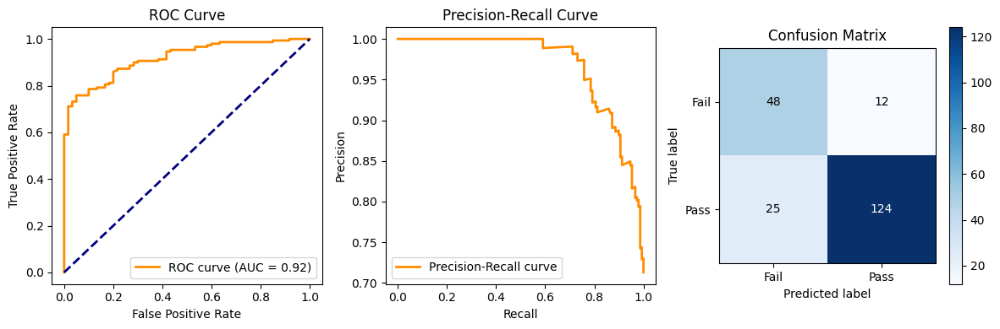

In [5]:
# Train the logistic regression gradient descent model using original data
theta_trained, cost_history = train_model(X_train, y_train, alpha, num_iterations, lambda_reg)
# Evaluate the logistic regression gradient descent model
evaluate_model(X_test, y_test, theta_trained, lambda_reg)
#Plot the evaluations
plot_evaluation_metrics(X_test, y_test, theta_trained)

c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.82
Precision: 0.93
Recall: 0.81
Confusion Matrix:
[[ 51   9]
 [ 29 120]]
Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.85      0.73        60
           1       0.93      0.81      0.86       149

    accuracy                           0.82       209
   macro avg       0.78      0.83      0.80       209
weighted avg       0.85      0.82      0.82       209



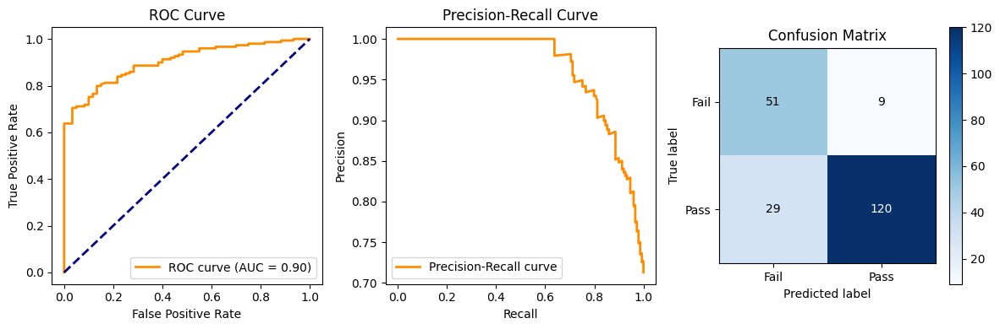

In [6]:
# Train the logistic regression gradient descent model using SMOTE data
theta_trained_smote, cost_history_smote = train_model(X_train_smote, y_train_smote, alpha, num_iterations, 1)
# Evaluate the logistic regression gradient descent model
evaluate_model(X_test, y_test, theta_trained_smote, lambda_reg)
#Plot the evaluations
plot_evaluation_metrics(X_test, y_test, theta_trained_smote)

c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.78
Precision: 0.96
Recall: 0.72
Confusion Matrix:
[[ 55   5]
 [ 42 107]]
Classification Report:
              precision    recall  f1-score   support

           0       0.57      0.92      0.70        60
           1       0.96      0.72      0.82       149

    accuracy                           0.78       209
   macro avg       0.76      0.82      0.76       209
weighted avg       0.84      0.78      0.79       209



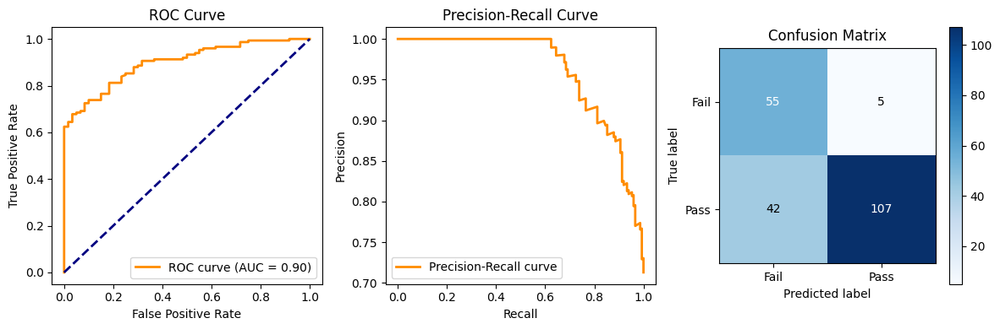

In [7]:
# Train the logistic regression gradient descent model using RandomUndersampled Data
theta_trained_rus, cost_history_rus = train_model(X_train_rus, y_train_rus, alpha, num_iterations, 0.7)
# Evaluate the logistic regression gradient descent model
evaluate_model(X_test, y_test, theta_trained_rus, lambda_reg)
#Plot the evaluations
plot_evaluation_metrics(X_test, y_test, theta_trained_rus)

Now we will apply K-FOLD cross validation on our models and select the best model and save it.

c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.79
Precision: 0.94
Recall: 0.79
Confusion Matrix:
[[ 27   7]
 [ 28 105]]
Classification Report:
              precision    recall  f1-score   support

           0       0.49      0.79      0.61        34
           1       0.94      0.79      0.86       133

    accuracy                           0.79       167
   macro avg       0.71      0.79      0.73       167
weighted avg       0.85      0.79      0.81       167

Accuracy: 0.62
Precision: 0.99
Recall: 0.53
Confusion Matrix:
[[33  1]
 [63 70]]
Classification Report:
              precision    recall  f1-score   support

           0       0.34      0.97      0.51        34
           1       0.99      0.53      0.69       133

    accuracy                           0.62       167
   macro avg       0.66      0.75      0.60       167
weighted avg       0.86      0.62      0.65       167



c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.84
Precision: 0.83
Recall: 1.00
Confusion Matrix:
[[  7  27]
 [  0 133]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.21      0.34        34
           1       0.83      1.00      0.91       133

    accuracy                           0.84       167
   macro avg       0.92      0.60      0.62       167
weighted avg       0.87      0.84      0.79       167

Accuracy: 0.87
Precision: 0.94
Recall: 0.90
Confusion Matrix:
[[ 26   8]
 [ 13 120]]
Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.76      0.71        34
           1       0.94      0.90      0.92       133

    accuracy                           0.87       167
   macro avg       0.80      0.83      0.82       167
weighted avg       0.88      0.87      0.88       167



c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.83
Precision: 0.82
Recall: 1.00
Confusion Matrix:
[[  5  29]
 [  0 133]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.15      0.26        34
           1       0.82      1.00      0.90       133

    accuracy                           0.83       167
   macro avg       0.91      0.57      0.58       167
weighted avg       0.86      0.83      0.77       167

Accuracy: 0.91
Precision: 0.98
Recall: 0.90
Confusion Matrix:
[[ 32   2]
 [ 13 120]]
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.94      0.81        34
           1       0.98      0.90      0.94       133

    accuracy                           0.91       167
   macro avg       0.85      0.92      0.88       167
weighted avg       0.93      0.91      0.91       167



c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.80
Precision: 0.80
Recall: 1.00
Confusion Matrix:
[[  0  34]
 [  0 133]]
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        34
           1       0.80      1.00      0.89       133

    accuracy                           0.80       167
   macro avg       0.40      0.50      0.44       167
weighted avg       0.63      0.80      0.71       167

Accuracy: 0.85
Precision: 0.96
Recall: 0.85
Confusion Matrix:
[[ 29   5]
 [ 20 113]]
Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.85      0.70        34
           1       0.96      0.85      0.90       133

    accuracy                           0.85       167
   macro avg       0.77      0.85      0.80       167
weighted avg       0.88      0.85      0.86       167

Accuracy: 0.84
Precision: 0.90
Recall: 0.87
Confusion Matrix:
[[ 45  15]
 [ 19 130]]
Classification Report:
              precisio

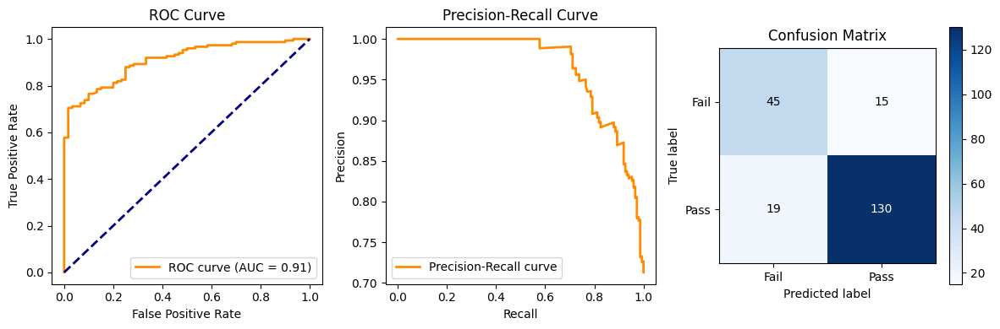

In [8]:
#let's apply K-Fold cross-validation to select the best logistic regression gradient descent model with original data
best_model_simple = k_fold_cross_validation(X_train, y_train, alpha, num_iterations, lambda_reg)
joblib.dump(best_model_simple, 'models/logreg_gd_simple')
# Evaluate the logistic regression gradient descent model
evaluate_model(X_test, y_test, best_model_simple, lambda_reg)
#Plot the evaluations
plot_evaluation_metrics(X_test, y_test, best_model_simple)

c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.84
Precision: 0.96
Recall: 0.71
Confusion Matrix:
[[33  1]
 [10 24]]
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.97      0.86        34
           1       0.96      0.71      0.81        34

    accuracy                           0.84        68
   macro avg       0.86      0.84      0.84        68
weighted avg       0.86      0.84      0.84        68

Accuracy: 0.85
Precision: 1.00
Recall: 0.71
Confusion Matrix:
[[34  0]
 [10 24]]
Classification Report:
              precision    recall  f1-score   support

           0       0.77      1.00      0.87        34
           1       1.00      0.71      0.83        34

    accuracy                           0.85        68
   macro avg       0.89      0.85      0.85        68
weighted avg       0.89      0.85      0.85        68



c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.84
Precision: 1.00
Recall: 0.68
Confusion Matrix:
[[34  0]
 [11 23]]
Classification Report:
              precision    recall  f1-score   support

           0       0.76      1.00      0.86        34
           1       1.00      0.68      0.81        34

    accuracy                           0.84        68
   macro avg       0.88      0.84      0.83        68
weighted avg       0.88      0.84      0.83        68

Accuracy: 0.91
Precision: 1.00
Recall: 0.82
Confusion Matrix:
[[34  0]
 [ 6 28]]
Classification Report:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92        34
           1       1.00      0.82      0.90        34

    accuracy                           0.91        68
   macro avg       0.93      0.91      0.91        68
weighted avg       0.92      0.91      0.91        68



c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.85
Precision: 0.96
Recall: 0.74
Confusion Matrix:
[[33  1]
 [ 9 25]]
Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.97      0.87        34
           1       0.96      0.74      0.83        34

    accuracy                           0.85        68
   macro avg       0.87      0.85      0.85        68
weighted avg       0.87      0.85      0.85        68

Accuracy: 0.94
Precision: 0.97
Recall: 0.91
Confusion Matrix:
[[33  1]
 [ 3 31]]
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.97      0.94        34
           1       0.97      0.91      0.94        34

    accuracy                           0.94        68
   macro avg       0.94      0.94      0.94        68
weighted avg       0.94      0.94      0.94        68



c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.84
Precision: 0.96
Recall: 0.71
Confusion Matrix:
[[33  1]
 [10 24]]
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.97      0.86        34
           1       0.96      0.71      0.81        34

    accuracy                           0.84        68
   macro avg       0.86      0.84      0.84        68
weighted avg       0.86      0.84      0.84        68

Accuracy: 0.82
Precision: 0.92
Recall: 0.71
Confusion Matrix:
[[32  2]
 [10 24]]
Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.94      0.84        34
           1       0.92      0.71      0.80        34

    accuracy                           0.82        68
   macro avg       0.84      0.82      0.82        68
weighted avg       0.84      0.82      0.82        68

Accuracy: 0.73
Precision: 0.98
Recall: 0.64
Confusion Matrix:
[[58  2]
 [54 95]]
Classification Report:
              precision    recall 

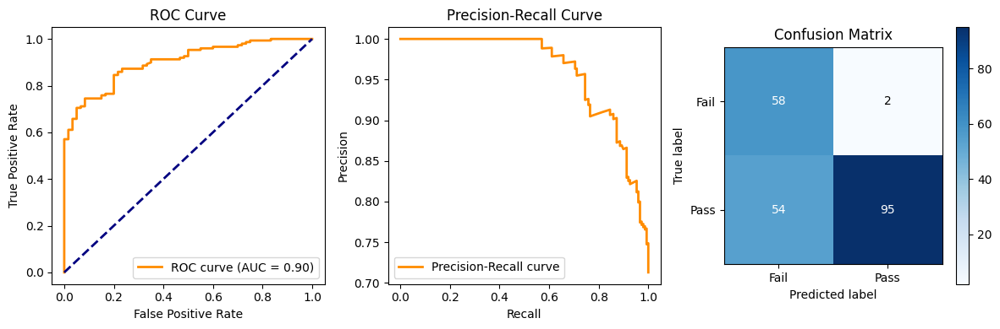

In [9]:
#let's apply K-Fold cross-validation to select the best logistic regression gradient descent model with RandomUndersampled data
best_model_rus = k_fold_cross_validation(X_train_rus, y_train_rus, alpha, num_iterations, 0.7)
joblib.dump(best_model_rus, 'models/logreg_gd_rus')
# Evaluate the logistic regression gradient descent model
evaluate_model(X_test, y_test, best_model_rus, lambda_reg)
#Plot the evaluations
plot_evaluation_metrics(X_test, y_test, best_model_rus)

c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.83
Precision: 1.00
Recall: 0.67
Confusion Matrix:
[[133   0]
 [ 44  89]]
Classification Report:
              precision    recall  f1-score   support

           0       0.75      1.00      0.86       133
           1       1.00      0.67      0.80       133

    accuracy                           0.83       266
   macro avg       0.88      0.83      0.83       266
weighted avg       0.88      0.83      0.83       266

Accuracy: 0.85
Precision: 0.91
Recall: 0.77
Confusion Matrix:
[[123  10]
 [ 30 103]]
Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.92      0.86       133
           1       0.91      0.77      0.84       133

    accuracy                           0.85       266
   macro avg       0.86      0.85      0.85       266
weighted avg       0.86      0.85      0.85       266



c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.70
Precision: 1.00
Recall: 0.40
Confusion Matrix:
[[133   0]
 [ 80  53]]
Classification Report:
              precision    recall  f1-score   support

           0       0.62      1.00      0.77       133
           1       1.00      0.40      0.57       133

    accuracy                           0.70       266
   macro avg       0.81      0.70      0.67       266
weighted avg       0.81      0.70      0.67       266

Accuracy: 0.90
Precision: 0.91
Recall: 0.88
Confusion Matrix:
[[122  11]
 [ 16 117]]
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       133
           1       0.91      0.88      0.90       133

    accuracy                           0.90       266
   macro avg       0.90      0.90      0.90       266
weighted avg       0.90      0.90      0.90       266



c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.90
Precision: 0.96
Recall: 0.83
Confusion Matrix:
[[128   5]
 [ 22 111]]
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.96      0.90       133
           1       0.96      0.83      0.89       133

    accuracy                           0.90       266
   macro avg       0.91      0.90      0.90       266
weighted avg       0.91      0.90      0.90       266

Accuracy: 0.92
Precision: 0.95
Recall: 0.89
Confusion Matrix:
[[127   6]
 [ 15 118]]
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.95      0.92       133
           1       0.95      0.89      0.92       133

    accuracy                           0.92       266
   macro avg       0.92      0.92      0.92       266
weighted avg       0.92      0.92      0.92       266



c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction\Classification\src\train_models.py:38: RuntimeWarning: divide by zero encountered in log
  cost = (-1 / m) * (y.dot(np.log(h)) + (1 - y).dot(np.log(1 - h))) + regularization_term
c:\Users\PMLS\Desktop\Task3_StudentPerformancePrediction

Accuracy: 0.87
Precision: 0.96
Recall: 0.77
Confusion Matrix:
[[129   4]
 [ 31 102]]
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.97      0.88       133
           1       0.96      0.77      0.85       133

    accuracy                           0.87       266
   macro avg       0.88      0.87      0.87       266
weighted avg       0.88      0.87      0.87       266

Accuracy: 0.89
Precision: 0.91
Recall: 0.86
Confusion Matrix:
[[121  12]
 [ 18 115]]
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.91      0.89       133
           1       0.91      0.86      0.88       133

    accuracy                           0.89       266
   macro avg       0.89      0.89      0.89       266
weighted avg       0.89      0.89      0.89       266

Accuracy: 0.84
Precision: 0.90
Recall: 0.87
Confusion Matrix:
[[ 45  15]
 [ 19 130]]
Classification Report:
              precisio

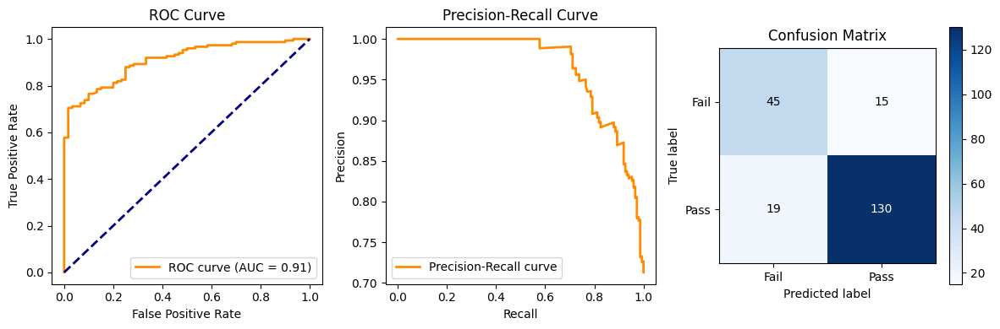

In [10]:
#let's apply K-Fold cross-validation to select the best logistic regression gradient descent model
best_model_smote = k_fold_cross_validation(X_train_smote, y_train_smote, alpha, num_iterations, 1)
joblib.dump(best_model_smote, 'models/logreg_gd_smote')
# Evaluate the logistic regression gradient descent model
evaluate_model(X_test, y_test, best_model_simple, lambda_reg)
#Plot the evaluations
plot_evaluation_metrics(X_test, y_test, best_model_simple)

Let's see if our models were saved correctly

Accuracy: 0.84
Precision: 0.90
Recall: 0.87
Confusion Matrix:
[[ 45  15]
 [ 19 130]]
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.75      0.73        60
           1       0.90      0.87      0.88       149

    accuracy                           0.84       209
   macro avg       0.80      0.81      0.81       209
weighted avg       0.84      0.84      0.84       209



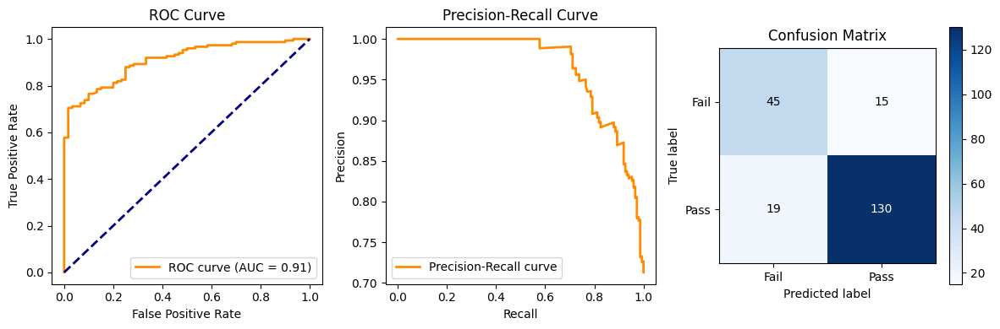

In [11]:
my = joblib.load('models/logreg_gd_simple')
evaluate_model(X_test,y_test,my,0.1)
plot_evaluation_metrics(X_test,y_test,my)

Now, let's move to Sklearn's Logistic Regression

c:\Users\PMLS\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\PMLS\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stab

{'C': 0.1}
Accuracy: 0.83
Precision: 0.84
Recall: 0.95
ROC_AUC: 0.92
Confusion Matrix:
[[ 32  28]
 [  7 142]]
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.53      0.65        60
           1       0.84      0.95      0.89       149

    accuracy                           0.83       209
   macro avg       0.83      0.74      0.77       209
weighted avg       0.83      0.83      0.82       209



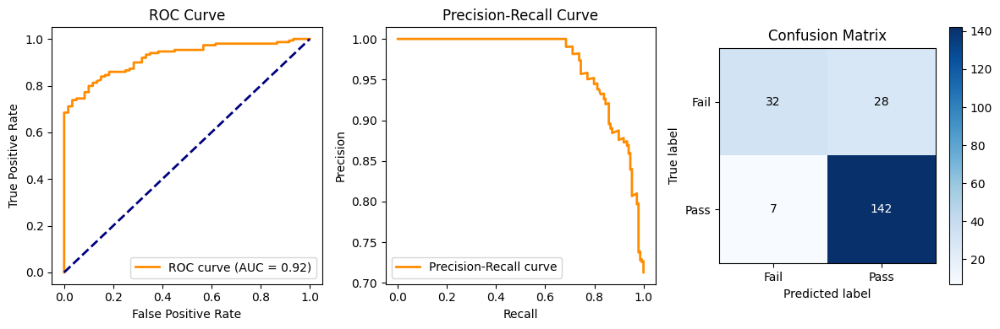

In [12]:
#Train and Evaluate using original Data
logreg = train_sklearn_logistic_regression(X_train,y_train)
joblib.dump(logreg,'models/logreg_simple')
evaluate_model_sklearn(X_test,y_test,logreg)
plot_evaluation_metrics_sklearn(X_test,y_test,logreg)

c:\Users\PMLS\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\PMLS\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stab

{'C': 0.1}
Accuracy: 0.83
Precision: 0.91
Recall: 0.85
ROC_AUC: 0.91
Confusion Matrix:
[[ 47  13]
 [ 23 126]]
Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.78      0.72        60
           1       0.91      0.85      0.88       149

    accuracy                           0.83       209
   macro avg       0.79      0.81      0.80       209
weighted avg       0.84      0.83      0.83       209



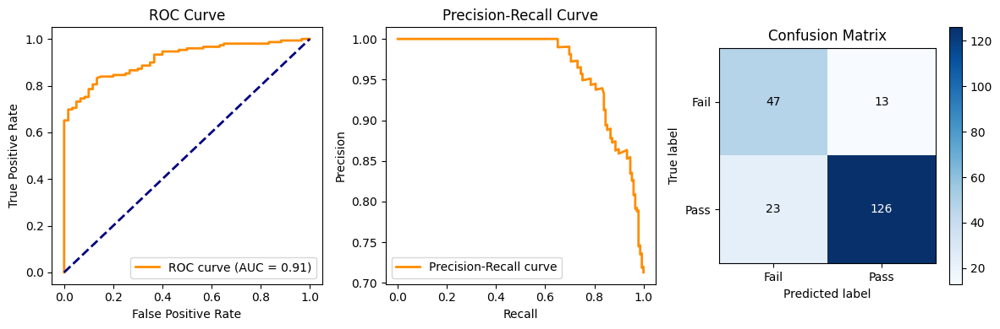

In [13]:
#Train and Evaluate using SMOTE Data
logreg = train_sklearn_logistic_regression(X_train_smote,y_train_smote)
joblib.dump(logreg,'models/logreg_smote')
evaluate_model_sklearn(X_test,y_test,logreg)
plot_evaluation_metrics_sklearn(X_test,y_test,logreg)

c:\Users\PMLS\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\PMLS\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stab

{'C': 0.1}
Accuracy: 0.82
Precision: 0.94
Recall: 0.80
ROC_AUC: 0.92
Confusion Matrix:
[[ 53   7]
 [ 30 119]]
Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.88      0.74        60
           1       0.94      0.80      0.87       149

    accuracy                           0.82       209
   macro avg       0.79      0.84      0.80       209
weighted avg       0.86      0.82      0.83       209



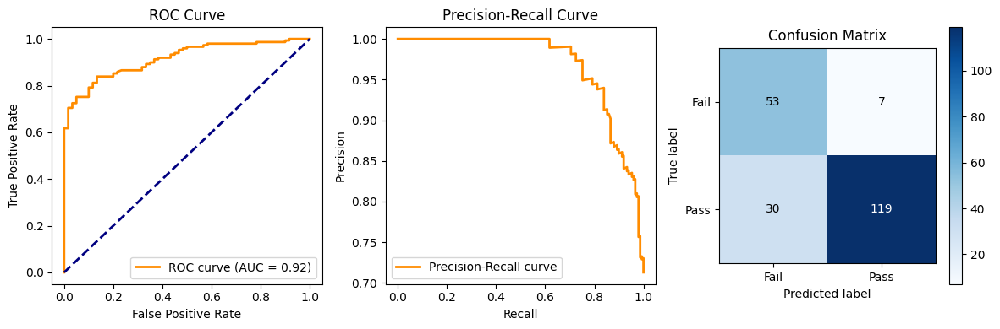

In [14]:
#Train and Evaluate using RandomUnderSampled Data
logreg = train_sklearn_logistic_regression(X_train_rus,y_train_rus)
joblib.dump(logreg,'models/logreg_rus')
evaluate_model_sklearn(X_test,y_test,logreg)
plot_evaluation_metrics_sklearn(X_test,y_test,logreg)

Let's see if our models have been saved successfully

Accuracy: 0.83
Precision: 0.84
Recall: 0.95
ROC_AUC: 0.92
Confusion Matrix:
[[ 32  28]
 [  7 142]]
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.53      0.65        60
           1       0.84      0.95      0.89       149

    accuracy                           0.83       209
   macro avg       0.83      0.74      0.77       209
weighted avg       0.83      0.83      0.82       209



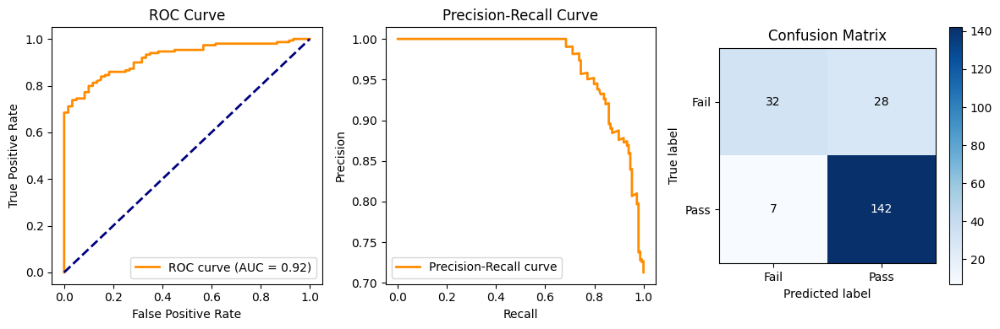

In [15]:
my2= joblib.load('models/logreg_simple')
evaluate_model_sklearn(X_test,y_test,my2)
plot_evaluation_metrics_sklearn(X_test,y_test,my2)

Finally, let's move towards the Decision Trees

{'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 4, 'min_samples_split': 2}
Accuracy: 0.82
Precision: 0.82
Recall: 0.95
ROC_AUC: 0.91
Confusion Matrix:
[[ 29  31]
 [  7 142]]
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.48      0.60        60
           1       0.82      0.95      0.88       149

    accuracy                           0.82       209
   macro avg       0.81      0.72      0.74       209
weighted avg       0.82      0.82      0.80       209



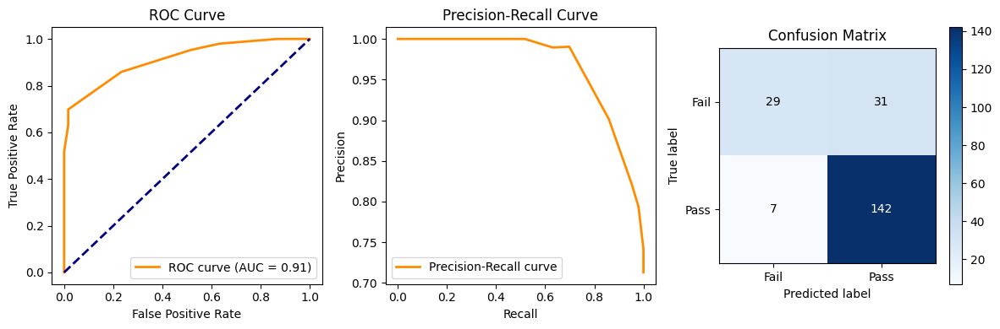

In [16]:
#Train using original data
dt = train_decision_tree(X_train,y_train)
joblib.dump(dt,'models/tree_simple')
evaluate_model_sklearn(X_test,y_test,dt)
plot_evaluation_metrics_sklearn(X_test,y_test,dt)

{'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 2}
Accuracy: 0.86
Precision: 0.85
Recall: 0.97
ROC_AUC: 0.91
Confusion Matrix:
[[ 35  25]
 [  5 144]]
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.58      0.70        60
           1       0.85      0.97      0.91       149

    accuracy                           0.86       209
   macro avg       0.86      0.77      0.80       209
weighted avg       0.86      0.86      0.85       209



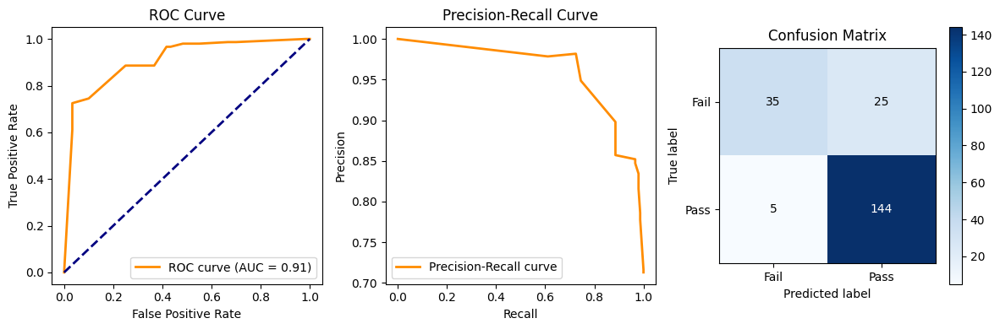

In [17]:
#Train using smote data
dt = train_decision_tree(X_train_smote,y_train_smote)
joblib.dump(dt,'models/tree_smote')
evaluate_model_sklearn(X_test,y_test,dt)
plot_evaluation_metrics_sklearn(X_test,y_test,dt)

{'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2}
Accuracy: 0.80
Precision: 0.94
Recall: 0.77
ROC_AUC: 0.89
Confusion Matrix:
[[ 53   7]
 [ 34 115]]
Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.88      0.72        60
           1       0.94      0.77      0.85       149

    accuracy                           0.80       209
   macro avg       0.78      0.83      0.78       209
weighted avg       0.85      0.80      0.81       209



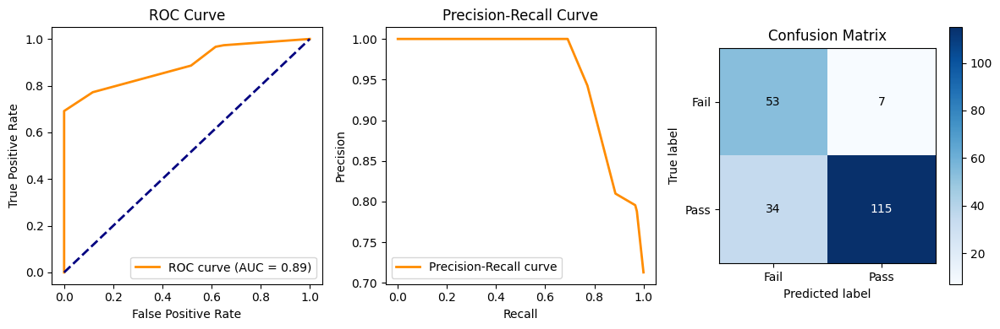

In [18]:
#Train using RandomUnderSampled data
dt = train_decision_tree(X_train_rus,y_train_rus)
joblib.dump(dt,'models/tree_rus')
evaluate_model_sklearn(X_test,y_test,dt)
plot_evaluation_metrics_sklearn(X_test,y_test,dt)

In [19]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
import joblib
parameters = {'criterion':['gini','entropy'],'max_depth':[4,5,6,7,8,9,10,11,12,15,20,30,40,50,70,90,120,150]}
grid_search = GridSearchCV(estimator = DecisionTreeClassifier(),
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 10,
                           n_jobs = -1)
grid_search = grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
best_model = grid_search.best_estimator_
joblib.dump(best_model, 'decision_tree.joblib')
print("Best Accuracy: {:.2f} %".format(best_accuracy * 100))
print("Best Parameters:", best_parameters)

Best Accuracy: 87.91 %
Best Parameters: {'criterion': 'entropy', 'max_depth': 4}


In [29]:
#Let's see if our models were saved
my3 = joblib.load('models/logreg_simple')

Accuracy: 0.83
Precision: 0.84
Recall: 0.95
ROC_AUC: 0.92
Confusion Matrix:
[[ 32  28]
 [  7 142]]
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.53      0.65        60
           1       0.84      0.95      0.89       149

    accuracy                           0.83       209
   macro avg       0.83      0.74      0.77       209
weighted avg       0.83      0.83      0.82       209



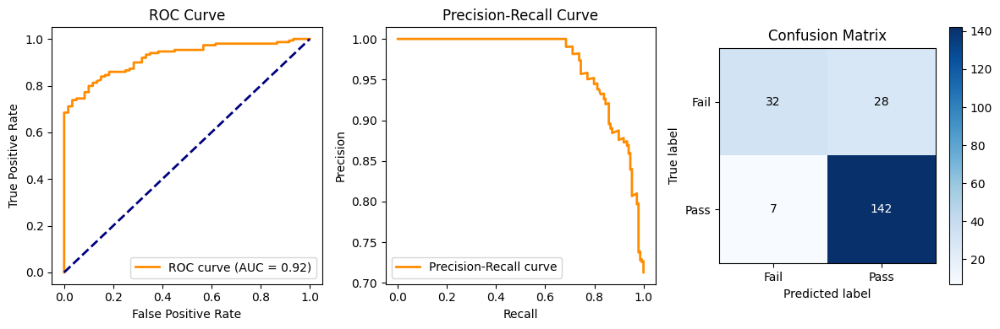

In [30]:
evaluate_model_sklearn(X_test,y_test,my3)
plot_evaluation_metrics_sklearn(X_test,y_test,my3)

In [22]:
sample = 44
prediction = my3.predict(X_test[sample].reshape(1,-1))

print("True Label",y_test.iloc[sample])
print("Predicted Label", prediction)

True Label 1
Predicted Label [1]


In [31]:
print(X_test)


[[ 0.  1.  0. ...  5.  8.  9.]
 [ 1.  0.  0. ...  5. 30.  8.]
 [ 1.  0.  1. ...  3.  0. 14.]
 ...
 [ 1.  0.  1. ...  5.  2. 12.]
 [ 1.  0.  1. ...  4.  0. 14.]
 [ 0.  1.  1. ...  4.  0. 11.]]


In [32]:
print(X_test[0])

[ 0.  1.  0.  1.  1.  0.  1.  0.  0.  1.  0.  0.  1.  0.  0.  0.  0.  1.
  0.  0.  1.  0.  0.  0.  0.  1.  0.  1.  0.  0.  1.  1.  0.  1.  0.  1.
  0.  0.  1.  0.  1.  1.  0. 18.  3.  2.  2.  1.  0.  2.  5.  5.  5.  5.
  5.  8.  9.]


In [60]:
new_sample = np.array([0., 1., 0., 1., 1., 0., 1., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 1.,
                       0., 0., 1., 0., 0., 0., 0., 1., 0., 1., 0., 0., 1., 1., 0., 1., 0., 1.,
                       0., 0., 1., 0., 1., 1., 0., 18., 3., 2., 2., 1., 0., 2., 5., 5., 5., 5.,
                       5., 8., 9.])

In [61]:
pred = my3.predict(new_sample.reshape(1,-1))
print(pred)

[1]
